# In this notebook, we will train a segmentation deep learning models to predict the cloud formations label and position

Some imports:

In [ ]:
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras import regularizers, optimizers
import sklearn
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import keras
import os


### Librairy used for data augmentation:
!pip install -U albumentations
import albumentations as A 

### Librairy used for pre-trained Unet models:
!pip install segmentation_models
import segmentation_models as sm

## the lines below are added to make segmentation_models work on colab
sm.set_framework('tf.keras')
sm.framework()

Segmentation Models: using `keras` framework.


'tf.keras'

Import the kaggle dataset and adapting it for tensorflow


In [ ]:
## Google Drive Mounnt.

from google.colab import drive
drive.mount('/content/drive')

## Il faut sélectionner indiquer ou se trouve les fichiers Kaggle sur son drive:

##### A MODIFIER PAR RAPPART A TON DRIVE ###########""
path_kaggle_data_gdrive = '/content/drive/MyDrive/DataScientest/Projet/Kaggle_Data/'

path_save_models_drive = '/content/drive/MyDrive/DataScientest/Projet/Run_Gabriel/Models/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Global Hyper Parameters

In [ ]:
#Network input/output size

IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3

# Number of cloud formations (Fish, Sugar, Gravel, Flower)
FORMATION_TYPES = 4



In [ ]:
# This cell is mandatory to prevent a tensorflow 'bug' due to global variable init:
# https://github.com/tensorflow/tensorflow/issues/29931
temp = tf.zeros([4, 32, 32, 3])
sm.get_preprocessing('vgg16')(temp);

## Formating the Dataframe for Tensorflow


In [ ]:
#Import du dataset et quelques modifs


train = pd.read_csv(path_kaggle_data_gdrive + 'train.csv')
train.head()

,Image_Label,EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg_Gravel,NaN
3,0011165.jpg_Sugar,NaN
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...


In [ ]:
train['Image'] = train['Image_Label'].apply(lambda name: name.split('_')[0])
train['Formation'] = train['Image_Label'].apply(lambda name: name.split('_')[1])
train = train.drop('Image_Label', axis = 1)
train = train.fillna('0 0') # Nans are replaces with empty masks
train= train[['Image', 'Formation', 'EncodedPixels']] ## Changing the colums order
train = train.reset_index()
train = train.drop('index', axis = 1)


In [ ]:
# We format the dataset to make it understandable  by TensorFlow

series_formation = train.groupby("Image")['Formation'].apply(lambda tags: ','.join(tags))

# we join all the masks together to make it more convenient for tensorflow
series_masks = train.groupby("Image")['EncodedPixels'].apply(lambda tags: ','.join(tags)) 
series_masks.head()
train_keras = pd.concat([series_formation, series_masks], axis = 1)
df = pd.DataFrame()

df['path'] = path_kaggle_data_gdrive + 'train_images/' + train_keras.index
df['formations'] = train_keras['Formation'].values
df['masks'] = train_keras['EncodedPixels'].values


df.head()

,path,formations,masks
0,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",264918 937 266318 937 267718 937 269118 937 27...
1,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",233813 878 235213 878 236613 878 238010 881 23...
2,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",3510 690 4910 690 6310 690 7710 690 9110 690 1...
3,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar","0 0,100812 462 102212 462 103612 462 105012 46..."
4,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",2367966 18 2367985 2 2367993 8 2368002 62 2369...


In [ ]:
df = pd.DataFrame()

df['path'] = path_kaggle_data_gdrive + 'train_images/' + train_keras.index
df['formations'] = train_keras['Formation'].values
df['masks'] = train_keras['EncodedPixels'].values

df.head()

,path,formations,masks
0,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",264918 937 266318 937 267718 937 269118 937 27...
1,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",233813 878 235213 878 236613 878 238010 881 23...
2,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",3510 690 4910 690 6310 690 7710 690 9110 690 1...
3,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar","0 0,100812 462 102212 462 103612 462 105012 46..."
4,/content/drive/MyDrive/DataScientest/Projet/Ka...,"Fish,Flower,Gravel,Sugar",2367966 18 2367985 2 2367993 8 2368002 62 2369...


Functions to decode the rle masks and conversion to tensors:

In [ ]:
def rle_decode_tf(mask_rle, shape):
    ''' This function decodes the RLE mask from kaggle and creates a mask of 
    shape of initial image size with 0 and 1 ''' 

    shape = tf.convert_to_tensor(shape, tf.int64)
    size = tf.math.reduce_prod(shape)
    # Split string
    s = tf.strings.split(mask_rle)
    s = tf.strings.to_number(s, tf.int64)
    # Get starts and lengths
    starts = s[::2] - 1
    lens = s[1::2]
    # Make ones to be scattered
    total_ones = tf.reduce_sum(lens)
    ones = tf.ones([total_ones], tf.uint8)
    # Make scattering indices
    r = tf.range(total_ones)
    lens_cum = tf.math.cumsum(lens)
    s = tf.searchsorted(lens_cum, r, 'right')
    idx = r + tf.gather(starts - tf.pad(lens_cum[:-1], [(1, 0)]), s)
    # Scatter ones into flattened mask
    mask_flat = tf.scatter_nd(tf.expand_dims(idx, 1), ones, [size])
    # Reshape into mask
    return tf.reshape(mask_flat, shape)

def create_masks_multi_labels_tf(masks_string, resize = (IMG_WIDTH,IMG_HEIGHT), formation_number = FORMATION_TYPES):
  ''' This function creates a masks with of dimension (IMG_WIDTH, IMG_HEIGHT,  FORMATION_TYPES)
 mask[:,:,i], with i:
  Fish = 0 :
  Flower = 1
  Gravel = 2
  Sugar = 3
  
 
  '''
  
  initial_size = (2100,1400)#1400,2100)
  
  masks_vector = tf.strings.split(masks_string, sep=',')

  
  list_mask = []
  for i in range(formation_number):   
    mask_i =  masks_vector[i]
    mask = rle_decode_tf(mask_i, initial_size) 
    mask = mask[tf.newaxis, ..., tf.newaxis]
    mask = tf.image.resize(mask, resize)[0,...,0]
    mask = tf.transpose(mask, perm=[1, 0])
    list_mask.append(mask)   
  
  mask_concat = tf.stack(list_mask, axis=2)
  
  return mask_concat



In [ ]:
initial_size = (2100,1400)

## Dataset Creation 




Creation of the loading functions with tensorflow to create the dataset.
It includes the data augmentation with Abumentation

In [ ]:


def load_image(filepath, backbone, resize=(IMG_HEIGHT,IMG_WIDTH)):

  input_image = tf.io.read_file(filepath)
  input_image = tf.image.decode_png(input_image, channels=3)
  input_image = tf.cast(input_image, tf.float32)
 
  input_image = tf.image.resize(input_image, resize)
  input_image = sm.get_preprocessing(backbone)(input_image)
  
  return input_image

def load_mask(datapoint, resize=(IMG_WIDTH,IMG_HEIGHT), formation_number = FORMATION_TYPES):
  input_mask = create_masks_multi_labels_tf(datapoint, resize)  
  return input_mask

## Data augmentation

def augment_dataset(dataset, im_height = IMG_HEIGHT,im_width = IMG_WIDTH,  
                    n_channels = IMG_CHANNELS, formation_types =FORMATION_TYPES ):
  transforms = A.Compose([
          #A.Transpose(p=0.5),
          A.HorizontalFlip(p=0.5),
          A.VerticalFlip(p=0.5),
          #A.ShiftScaleRotate(p=0.5)
          ], p=1)

  def aug_fn(image, mask):
      data = {"image":image, "mask":mask}
      aug_data = transforms(**data)
      aug_img = aug_data["image"]
      aug_img = tf.cast(aug_img, tf.float32)
      aug_mask = aug_data["mask"]
      aug_mask = tf.cast(aug_mask, tf.float32)
      return aug_img, aug_mask

  def process_data(image, mask):
      aug_img, aug_mask = tf.numpy_function(func=aug_fn, inp=[image, mask], Tout= [tf.float32, tf.float32] )
      
      return aug_img, aug_mask

  def set_shapes(img, mask, img_shape=(im_height, im_width,  n_channels), mask_shape=( im_height,im_width, formation_types)):
      img.set_shape(img_shape)
      mask.set_shape(mask_shape)
      
      return img, mask

  ds_alb = dataset.map(process_data, num_parallel_calls=-1)
  ds_alb = ds_alb.map(set_shapes, num_parallel_calls=-1)

  return ds_alb


def create_dataset(Xt, yt, backbone, augmentation = False, batch_size = 32):
  dataset = tf.data.Dataset.from_tensor_slices((Xt, yt))
  dataset = dataset.map(lambda x, y : [load_image(x, backbone), load_mask(y)], num_parallel_calls=-1)
  if augmentation:
    dataset = augment_dataset(dataset)
  
  return dataset.batch(batch_size)


## Train/test dataset

In [ ]:
X_train_path, X_test_path, y_train, y_test = train_test_split(df.path, df.masks, train_size=0.8, random_state=456)

## Model Definition

We will use here 3 Unets models with different pretrained backbones:


*   Model 1: Resnet34 backbone
*   Model 2: Inceptionv3 backbone
*   Model 3: Moblenet backbone





### Resnet Model

In [ ]:
###Model 1
BACKBONE1 = 'resnet34'

# Datasets
train_batches1 = create_dataset(X_train_path,y_train, augmentation = True, backbone = BACKBONE1)
test_batches1 = create_dataset(X_test_path,y_test, augmentation = False, backbone = BACKBONE1)

# define model
model1 = sm.Unet(BACKBONE1, encoder_weights='imagenet', classes=FORMATION_TYPES, activation='sigmoid')

### Inceptionv3 Model



In [ ]:
###Model 2
BACKBONE2 = 'inceptionv3'

# Datasets
train_batches2 = create_dataset(X_train_path,y_train, augmentation = True, backbone = BACKBONE2)
test_batches2 = create_dataset(X_test_path,y_test, augmentation = False, backbone = BACKBONE2)

# define model
model2 = sm.Unet(BACKBONE2, encoder_weights='imagenet', classes=FORMATION_TYPES, activation='sigmoid')

###MobileNEt Model

In [ ]:
###Model 3
BACKBONE3 = 'mobilenet'

# preprocess input
train_batches3 = create_dataset(X_train_path,y_train, augmentation = True, backbone = BACKBONE3)
test_batches3 = create_dataset(X_test_path,y_test, augmentation = False, backbone = BACKBONE3)

# define model
model3 = sm.Unet(BACKBONE3, encoder_weights='imagenet', classes=FORMATION_TYPES, activation='sigmoid')

/usr/local/lib/python3.7/dist-packages/keras_applications/mobilenet.py:207: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


## Loss Functions

In [ ]:
from tensorflow import reduce_sum

# Dice similarity coefficient loss, brought to you by: https://github.com/nabsabraham/focal-tversky-unet
def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = Flatten()(y_true)
    y_pred_f = Flatten()(y_pred)
    intersection = reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (reduce_sum(y_true_f) + reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

# Focal Tversky loss, brought to you by:  https://github.com/nabsabraham/focal-tversky-unet
def tversky(y_true, y_pred, smooth=1e-6):
    y_true_pos = tf.keras.layers.Flatten()(y_true)
    y_pred_pos = tf.keras.layers.Flatten()(y_pred)
    true_pos = tf.reduce_sum(y_true_pos * y_pred_pos)
    false_neg = tf.reduce_sum(y_true_pos * (1-y_pred_pos))
    false_pos = tf.reduce_sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky_loss(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return tf.keras.backend.pow((1-pt_1), gamma)

def dsc_per_formation(y_true, y_pred):
    scores = []
    for i in range(FORMATION_TYPES):
      scores.append(dsc(y_true[:,:,:,i], y_pred[:,:,:,i]))
    return scores

Custom Losses function


In [ ]:
def dsc_custom(y_true, y_pred):
  ## the custom is that we do not count the error when several formations are predicited at the same spot
    smooth = 1.
    ## Computing of the matrix M where the terms are zero where the formations are overlapping
    sum_mask = y_true[:,:,:,0] + y_true[:,:,:,1] + y_true[:,:,:,2] + y_true[:,:,:,3]
    overlaps = tf.where(sum_mask > 1)
    M = tf.where(sum_mask > 1, tf.zeros([IMG_WIDTH, IMG_HEIGHT], dtype='float32'), tf.ones([IMG_WIDTH, IMG_HEIGHT], dtype='float32'))
   
    M = tf.expand_dims(M, -1)
    M = tf.repeat(M, repeats=[4], axis=-1) # M has now the same dimension as y_pred and y_true

    y_true_mod  = tf.multiply(y_true,M)
    y_pred_mod  = tf.multiply(y_pred, M)

    
    y_true_f = Flatten()(y_true_mod)
    y_pred_f = Flatten()(y_pred_mod)
    intersection = reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (reduce_sum(y_true_f) + reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss_custom(y_true, y_pred):
    loss = 1 - dsc_custom(y_true, y_pred)
    return loss





## Callback definition

In [ ]:
from tensorflow.keras import callbacks

# Savegarde automatique des poids  
def callback_checkpoint(path):
  cb = callbacks.ModelCheckpoint(filepath=path, 
                                        monitor='val_loss',
                                        save_best_only=True,
                                        save_weights_only=False,
                                        mode='min',
                                        save_freq='epoch')
  return cb
  

# Réduction automatique du taux d'apprentissage
lr_plateau = callbacks.ReduceLROnPlateau(monitor='val_loss',
                                          patience=3,
                                          factor=0.1,
                                          verbose=2)
  
# On s'arrête quand le val_loss ne diminue plus
early_stopping = callbacks.EarlyStopping(monitor = 'val_loss',
                                           patience = 6, 
                                           mode = 'min', 
                                           restore_best_weights=True)



## Models Training

In [ ]:
## Model Compilation


model1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.001),
              #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              loss = dice_loss,metrics=[dsc])

## Creation of the directory to save the weights
checkpoint_path = path_save_models_drive + 'Unet/Data_aug/Model1/'

## Loads of the weight from previous fit
if True:
  model1.load_weights(checkpoint_path)

if not os.path.exists(checkpoint_path):
  os.makedirs(checkpoint_path)

if False:
  history1 = model1.fit(train_batches1, epochs=30, validation_data=test_batches1, 
                          callbacks=[lr_plateau, 
                                      callback_checkpoint(checkpoint_path),
                                      early_stopping,
                                     keras.callbacks.TensorBoard(checkpoint_path)])
  

In [ ]:
logdir=path_save_models_drive + 'Unet/Data_aug/Model1/'
print(logdir)

/content/drive/MyDrive/DataScientest/Projet/Run_Gabriel/Models/Unet/Data_aug/Model1/


In [ ]:
# %tensorboard --port=5037 --logdir checkpoint_path

In [ ]:

## Model Compilation

model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.001),
              #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              loss = dice_loss,
              metrics=[dsc])

## Creation of the directory to save the weights
checkpoint_path = path_save_models_drive + 'Unet/Data_aug/Model2/'

## Loads of the weight from previous fit
if True:
  model2.load_weights(checkpoint_path)

if not os.path.exists(checkpoint_path):
  os.makedirs(checkpoint_path)

if False:
  history2 = model2.fit(train_batches2, epochs=60, validation_data=test_batches2, 
                          callbacks=[lr_plateau, callback_checkpoint(checkpoint_path), early_stopping,keras.callbacks.TensorBoard(checkpoint_path)])

In [ ]:
logdir=path_save_models_drive + 'Unet/Data_aug/Model3/'
print(logdir)

/content/drive/MyDrive/DataScientest/Projet/Run_Gabriel/Models/Unet/Data_aug/Model3/


In [ ]:
# %tensorboard --port=5036 --logdir logdir

In [ ]:
## Model Compilation

model3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.001),
              #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              loss = dice_loss,
              metrics=[dsc])

## Creation of the directory to save the weights
checkpoint_path = path_save_models_drive + 'Unet/Data_aug/Model3/'

## Loads of the weight from previous fit
if True:
  model3.load_weights(checkpoint_path)

if not os.path.exists(checkpoint_path):
  os.makedirs(checkpoint_path)

if False:
  history3 = model3.fit(train_batches3, epochs=60, validation_data=test_batches3, 
                          callbacks=[lr_plateau, callback_checkpoint(checkpoint_path), early_stopping, keras.callbacks.TensorBoard(checkpoint_path)])

## Model Results and plots

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


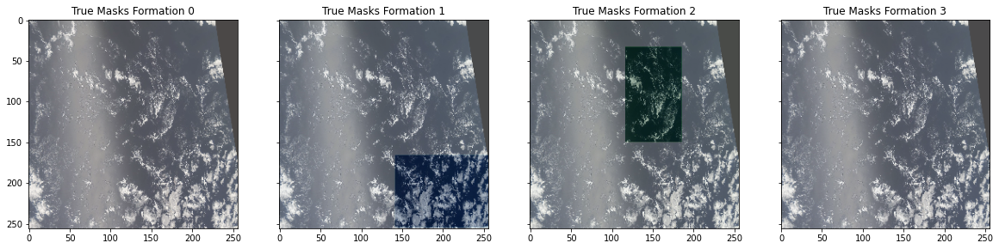

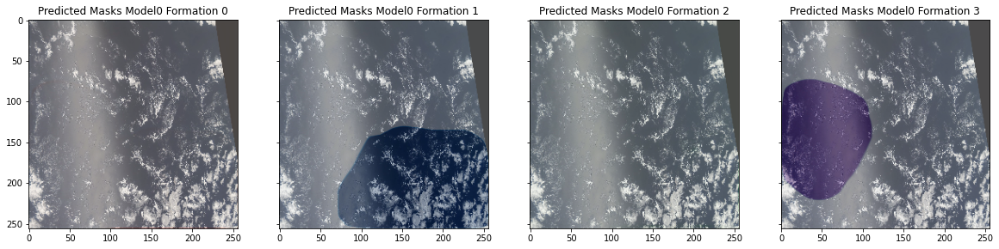

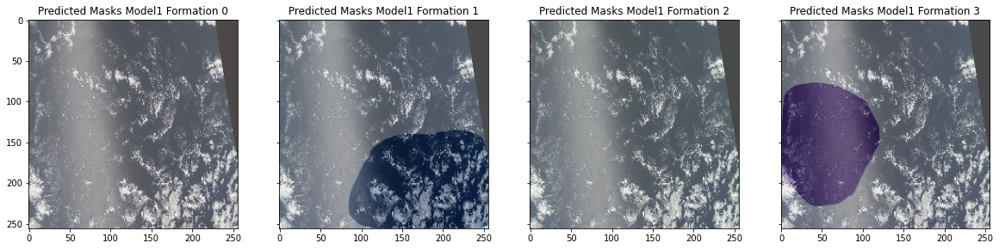

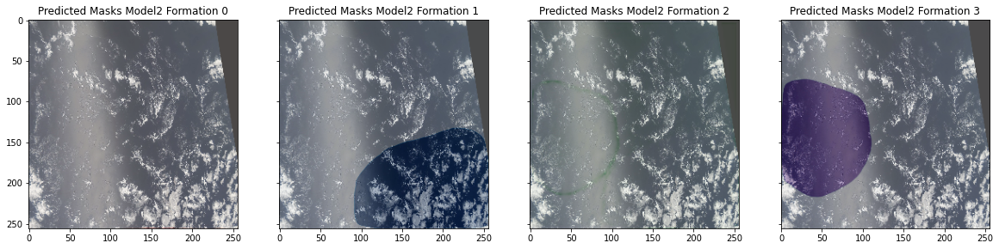

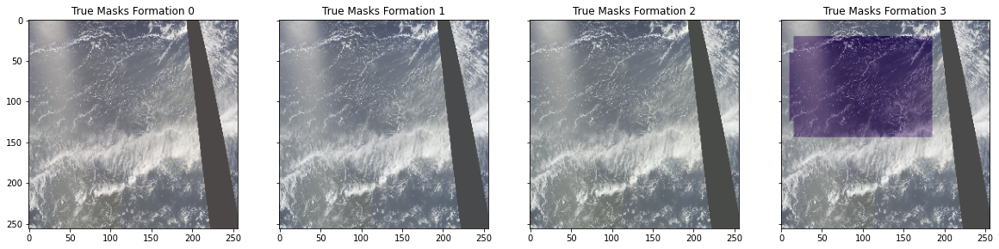

...

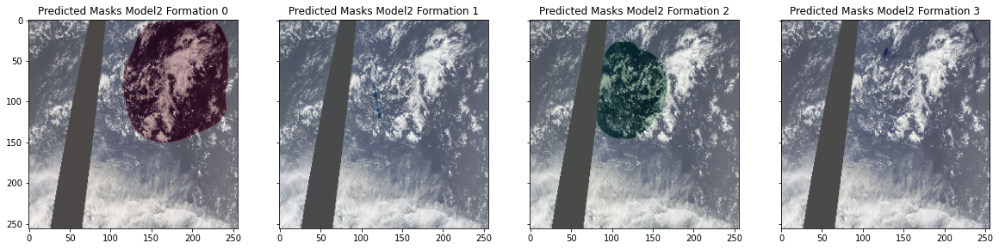

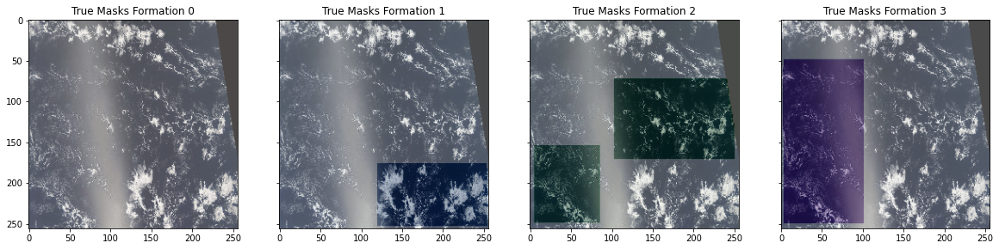

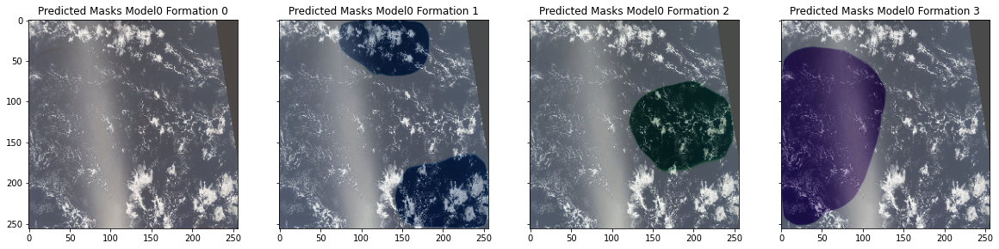

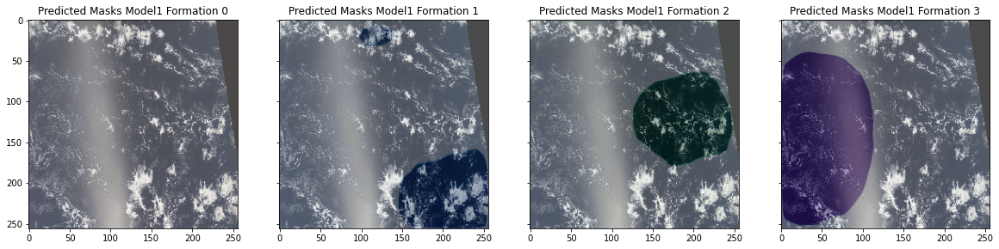

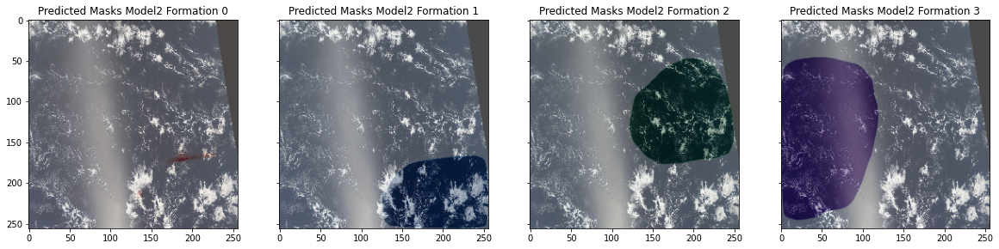

In [ ]:

# visualize cloud image with four classes of faults in seperate columns
def viz_cloud_img_mask(img, masks, label):
    img = tf.keras.preprocessing.image.array_to_img(img)
    fig, ax = plt.subplots(nrows=1, ncols=4, sharey=True, figsize=(20,10))
    cmaps = ["Reds", "Blues", "Greens", "Purples"]
    for i in range(FORMATION_TYPES):    
        ax[i].imshow(img)
        ax[i].imshow(masks[:,:,i], alpha=0.3, cmap=cmaps[i])
        ax[i].set_title(label + ' Formation ' + str(i))

def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display(image[0], mask[0], create_binary_mask(pred_mask[0]))
  else:
    display(sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...])))

def compare_predictions(models_list, datasets_list, num = 2):
  for j in range(num):
    for image, mask in datasets_list[0].take(1):
        image = image[j]
        mask = mask[j]
        viz_cloud_img_mask(image, mask, 'True Masks')
    
    for i in range(len(models_list)):
      for image, mask in datasets_list[i].take(1):
        pred_mask = models_list[i].predict(image)
        image = image[j]
        mask = mask[j]
        pred_mask = pred_mask[j]
        
        
        viz_cloud_img_mask(image, pred_mask, 'Predicted Masks Model' + str(i))





compare_predictions([model1, model2, model3], [test_batches1, test_batches2, test_batches3], num=10)

## Ensemble predictions with Tensor Flow

The idea here is to have an ensemble model that performs linear combination of the 3 models above to improve the dsc.
For that, we need to create another dataset and ensemble model:


In [ ]:
def load_predicted_mask(filepath, backbones, models, resize=(IMG_WIDTH, IMG_HEIGHT)):

  input_image = tf.io.read_file(filepath)
  input_image = tf.image.decode_png(input_image, channels=3)
  input_image = tf.cast(input_image, tf.float32)
 
  input_image = tf.image.resize(input_image, resize)
  

  pred_list = []

  for i in range(len(backbones)):
    input_image_pre = sm.get_preprocessing(backbones[i])(input_image)
    input_image_pre = tf.expand_dims(input_image_pre, axis=0)
    pred_mask = models[i](input_image_pre)[0]
    pred_list.append(pred_mask)

  
  predicted_masks = tf.stack(pred_list)
  
  return predicted_masks

def load_mask(datapoint, resize=(IMG_WIDTH, IMG_HEIGHT), formation_number = FORMATION_TYPES):
  input_mask = create_masks_multi_labels_tf(datapoint, resize)  
  return input_mask



def create_dataset_ensemble(Xt, yt, backbones, models,  batch_size = 32):
  dataset = tf.data.Dataset.from_tensor_slices((Xt, yt))
  dataset = dataset.map(lambda x, y : [load_predicted_mask(x, backbones, models), load_mask(y)], num_parallel_calls=-1)

  return dataset.batch(batch_size)


train_dataset_ensemble = create_dataset_ensemble(X_train_path,y_train, backbones = [BACKBONE1, BACKBONE2, BACKBONE3],
                        models = [model1, model2, model3])

test_dataset_ensemble = create_dataset_ensemble(X_test_path,y_test, backbones = [BACKBONE1, BACKBONE2, BACKBONE3],
                        models = [model1, model2, model3])

In [ ]:
class Ensemble_Unets(tf.Module):
  def __init__(self, unet_models_number, formation_types, name=None):
    super().__init__(name=name)
    # self.m = tf.Variable(
    #   tf.random.normal([formation_types, unet_models_number]), name='m')
    self.m = tf.Variable(
      tf.ones([formation_types, unet_models_number])/unet_models_number, name='m',
       trainable=True)
    self.formation_types = formation_types
    self.unet_models_number = unet_models_number
    
  def __call__(self, x):
    y_pred_combine = []
    #print(self.m)
    for i_formation in range(self.formation_types):
      m_sum = 0
      y_formation_sum = 0
      
      for j_model in range(self.unet_models_number):
        m_sum += self.m[i_formation, j_model]       
        y_formation_sum += self.m[i_formation, j_model] * x[:, j_model,:,:,i_formation]
      
      y_formation_sum_norm = y_formation_sum/m_sum
      y_pred_combine.append(y_formation_sum)
      
      y_out = tf.stack(y_pred_combine, -1)
      ## we limit the output model to be between 0 and 1:
      y_out_limited = tf.where(y_out >= 1, tf.ones_like(y_out, dtype='float32'), y_out)
      y_out_limited =  tf.where(y_out_limited <= 0, tf.zeros_like(y_out, dtype='float32'), y_out_limited)
    return y_out_limited
    

model_ensemble = tf.keras.Sequential(Ensemble_Unets(3,4))



In [ ]:
model_ensemble.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 5e-3),
              #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              loss = dice_loss,
              metrics=[dsc,"accuracy"])

## Creation of the directory to save the weights
checkpoint_path = '/content/drive/MyDrive/DataScientest/Projet/Unet/EnsembleModel/'

## Loads of the weight from previous fit
model_ensemble.load_weights(checkpoint_path)

if not os.path.exists(checkpoint_path):
  os.makedirs(checkpoint_path)

model_ensemble.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 5e-3),
              #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              loss = dice_loss,
              metrics=[dsc,"accuracy"])

history = model_ensemble.fit(train_dataset_ensemble, epochs=2, validation_data=test_dataset_ensemble, 
                          callbacks=[lr_plateau, 
                                      callback_checkpoint(checkpoint_path),
                                      early_stopping])

Epoch 1/2
  3/139 [..............................] - ETA: 1:50:23 - loss: 0.4074 - dsc: 0.5926 - accuracy: 0.3515

KeyboardInterrupt: ignored